In [1]:
from xml.dom.minidom import parse
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import math
import operator
from sklearn.cluster import MeanShift
import random
import copy

In [88]:
path = 'C:\\Users\\HP\\Desktop\\Jupyter_notebook_files\\PR_lab Project\\'
dataset = '001'
main_xml_file = '\\sub_Graph.xml'
edited_xml_file = '\\new_edited.xml'

main_xml_file_path = path + dataset + main_xml_file
edited_xml_file_path = path + dataset + edited_xml_file


# Extract Information from XML

In [3]:
## Collect nodes from XML
## docs -> XML file
## node_dict -> {node_id: [vector_array]} -> {1:[x,y,z], 2:[x,y,z], ...}
## node_id_list -> [node_id_list] -> [1,2,3,...]

def collect_nodes(docs):
    nodes = docs.getElementsByTagName('node')
    num_nodes = nodes.length
    node_dict = {}
    node_id_list = []
    for i in range (0,num_nodes):
        vector_str = nodes[i].getElementsByTagName("Vector3")[0].childNodes[0].nodeValue
        vector_split = vector_str.split()
        vector_array = list(map(float, vector_split))
        node_id = int(nodes[i].getElementsByTagName("id")[0].childNodes[0].nodeValue)
        node_id_list.append(node_id)  # can be used in networkx
        node_dict[node_id] = vector_array
    
    return node_dict, node_id_list

In [4]:
## Draw nodes on plot
## x_nodes, y_nodes, z_nodes -> x/y/z axis of nodes
# For <node> 'black' circles

def draw_nodes(node_dict, node_id_list, c = 'lightgreen', s = 5, text = '', text_pose="bottom center", legend_group = '',m='markers'):
    x_nodes = [node_dict[i][0] for i in node_id_list]   # x-coordinates of nodes
    y_nodes = [node_dict[i][1] for i in node_id_list]   # y-coordinates
    z_nodes = [node_dict[i][2] for i in node_id_list]   # z-coordinates
    
    trace_nodes = go.Scatter3d(x=x_nodes,
                         y=y_nodes,
                        z=z_nodes,
                        legendgroup = legend_group,
                        name = text,
                        mode=m,
                        marker=dict(symbol='circle',
                                    size=s,
                                    colorscale=[c,'magenta'], #either green or mageneta
                                    line=dict(color='black', width=0.5)),
                        text= node_id_list, textposition = text_pose,
                        hoverinfo='text')

    return trace_nodes

In [5]:
######### Change ###########
## Collect edges from XML
## docs -> XML file
## edge_list -> [(predid1, succid1), (predid2, succid2),....]
## edge_id_list -> [1,2,3,...]

def collect_edges(docs):
    edges = docs.getElementsByTagName('edge')
    num_edges = edges.length
    edge_list = []
    edge_id_list = []
    edge_dict = {}
    for i in range(0, num_edges):
        predid = int(edges[i].getElementsByTagName("PredId")[0].childNodes[0].nodeValue)
        succid = int(edges[i].getElementsByTagName("SuccId")[0].childNodes[0].nodeValue)
        edge_list.append([predid, succid])
        edge_id = int(edges[i].getElementsByTagName("id")[0].childNodes[0].nodeValue)
        edge_id_list.append(edge_id)
        edge_dict[edge_id] = [predid, succid]

    return edge_list, edge_id_list, edge_dict

In [6]:
## Given edge_id_list(i.s removed_edge) convert to edge_list(like (node1, node2))
## [3, 56, 7, ...] -> [(predid3, succid3), (predid56, succid56), ...]

def list_to_edge_list(modified_edge_id_list, edge_list, edge_id_list):
    modified_edge_list = []
    for i in modified_edge_id_list:
        index = edge_id_list.index(i)
        modified_edge_list.append(edge_list[index])
    return modified_edge_list

In [7]:
########### change #############
## Draw edges
## calculate edge_length

def draw_edges(edge_list=[], edge_id_list=[], edge_dict={}, node_dict={}, c = 'red', w = 5, text = 'Edges'):
    x_edges = []
    y_edges = []
    z_edges = []
    
    if edge_list:
        for edge in edge_list:
            x_coords = [node_dict[edge[0]][0],node_dict[edge[1]][0],None]
            x_edges += x_coords


            y_coords = [node_dict[edge[0]][1],node_dict[edge[1]][1],None]
            y_edges += y_coords

            z_coords = [node_dict[edge[0]][2],node_dict[edge[1]][2],None]
            z_edges += z_coords
            
    elif edge_id_list:
        for edge in edge_id_list:
            node1 = edge_dict[edge][0]
            node2 = edge_dict[edge][1]
            x_coords = [node_dict[node1][0],node_dict[node2][0],None]
            x_edges += x_coords


            y_coords = [node_dict[node1][1],node_dict[node2][1],None]
            y_edges += y_coords

            z_coords = [node_dict[node1][2],node_dict[node2][2],None]
            z_edges += z_coords

    trace_edges = go.Scatter3d(x=x_edges,
                            y=y_edges,
                            z=z_edges,
                            mode='lines',
                            name = text,
                            line=dict(color= c, width= w),
                            text = edge_id_list,
                            hoverinfo='text')
    
    return trace_edges

In [8]:
########### change ###########
######## new ##########
########### change #############
## calculate edge_length

def edge_length(edge_id_list=[], edge_dict={}, node_dict={}):
    x_edges = []
    y_edges = []
    z_edges = []
    edge_length_dict = {}

    if edge_id_list:
        for edge in edge_id_list:
            node1 = edge_dict[edge][0]
            node2 = edge_dict[edge][1]
            x_coords = [node_dict[node1][0],node_dict[node2][0],None]
            x_edges += x_coords


            y_coords = [node_dict[node1][1],node_dict[node2][1],None]
            y_edges += y_coords

            z_coords = [node_dict[node1][2],node_dict[node2][2],None]
            z_edges += z_coords

            length = math.sqrt(pow((x_coords[0] - x_coords[1]), 2) + pow((y_coords[0] - y_coords[1]), 2) + pow((z_coords[0] - z_coords[1]), 2))
            edge_length_dict[edge] = length
    
    return edge_length_dict

In [9]:
######### change ############
## Collect and draw skeleton nodes and edges
## all_skeletons_dict[edge_id_list[i]] = (skeleton_node_list, skeleton_width_list)

def collect_skeletons(docs, edge_list=[], edge_id_list=[], edge_dict={}, node_dict={}):

    edges_address = docs.getElementsByTagName('edge')
    num_edges = edges_address.length
    all_skeletons_dict = {}
#     all_skeleton_edge_dict = {}

    for edge in edge_id_list:
        predid = edge_dict[edge][0]  # can be used in networkx
        succid = edge_dict[edge][1]  # can be used in networkx
        predid_coords = node_dict[predid]
        succid_coords = node_dict[succid]
        index = edge_id_list.index(edge)
        skeletons = edges_address[index].getElementsByTagName("Skeletons")[0].getElementsByTagName("Skeleton")
        
        num_skeletons = skeletons.length
        skeleton_node_dict = {}
#         skeleton_edge_list = []
        skeleton_node_list = []
        skeleton_width_list = []
        prev = predid_coords

        for j in range(0, num_skeletons+1):
            if j < num_skeletons:
                vector_str = skeletons[j].getElementsByTagName("Vector3")[0].childNodes[0].nodeValue
                min_distance = skeletons[j].getElementsByTagName("double")[0].childNodes[0].nodeValue
                skeleton_width_list.append(float(min_distance))
                vector_split = vector_str.split()
                vector_array = list(map(float, vector_split))
                skeleton_node_list.append(vector_array)
                skeleton_node_dict[j] = vector_array
#                 if (prev==predid_coords and vector_array==succid_coords) or (prev==succid_coords and vector_array==predid_coords):
#                     pass
#                 else :
#                     skeleton_edge_list.append([prev, vector_array])
#                 prev = vector_array
# #             elif j == num_skeletons:
# #                 skeleton_edge_list.append((prev, succid_coords))
        all_skeletons_dict[edge] = [skeleton_node_list, skeleton_width_list]
#         all_skeleton_edge_dict[edge] = skeleton_edge_list
        

    return all_skeletons_dict

In [10]:
######## change ##########
###### new #########
######### change ############
## Collect and draw skeleton nodes and edges
## all_skeletons_dict[edge_id_list[i]] = (skeleton_node_list, skeleton_width_list)

def draw_skeletons(edge_id_list=[], all_skeletons_dict={}, all_skeleton_edge_dict={},
                   edge_dict={}, node_dict={}, text1 = 'Skeleton_edges', text2 = 'Skeleton_nodes'):

    #### new skeleton edges
    if not all_skeleton_edge_dict:
        all_skeleton_edge_dict = {}

        for edge in edge_id_list:
            predid = edge_dict[edge][0]  # can be used in networkx
            succid = edge_dict[edge][1]  # can be used in networkx
            predid_coords = node_dict[predid]
            succid_coords = node_dict[succid]

            num_skeletons = len(all_skeletons_dict[edge][0])
            skeleton_edge_list = []
            prev = list(predid_coords)

            for j in range(0, num_skeletons+1):
                if j < num_skeletons:
                    vector_array = list(all_skeletons_dict[edge][0][j])
                    if prev!=vector_array:
                        if (prev==predid_coords and vector_array==succid_coords) or (prev==succid_coords and vector_array==predid_coords):
                            pass
                        else :
                            skeleton_edge_list.append([prev, vector_array])
                        prev = vector_array
                    else:
                        pass
    #             elif j == num_skeletons:
    #                 skeleton_edge_list.append((prev, succid_coords))
            all_skeleton_edge_dict[edge] = skeleton_edge_list
    ###
    else:
        pass
    x_skeleton_nodes = []
    y_skeleton_nodes = []
    z_skeleton_nodes = []
    data_r = []
    i = 0
    s_x_edges = []
    s_y_edges = []
    s_z_edges = []
    for edge in edge_id_list:   
        for s_edge in all_skeleton_edge_dict[edge]:
            # format: [beginning,ending,None]
            s_x_coords = [s_edge[0][0], s_edge[1][0], None]
            s_x_edges += s_x_coords

            s_y_coords = [s_edge[0][1], s_edge[1][1], None]
            s_y_edges += s_y_coords

            s_z_coords = [s_edge[0][2], s_edge[1][2], None]
            s_z_edges += s_z_coords
    
        x_skeleton_nodes.extend([i[0] for i in all_skeletons_dict[edge][0]])  # x-coordinates of skeleton nodes
        y_skeleton_nodes.extend([i[1] for i in all_skeletons_dict[edge][0]])  # y-coordinates
        z_skeleton_nodes.extend([i[2] for i in all_skeletons_dict[edge][0]])  # z-coordinates

    trace_skeleton_edges = go.Scatter3d(x=s_x_edges,
                               y=s_y_edges,
                               z=s_z_edges,
                               mode= 'lines',
                               name = text1,
                               line=dict(color='red', width=5),
                               hoverinfo='none')
    data_r.append(trace_skeleton_edges)
    
    trace_skeleton_nodes = go.Scatter3d(x=x_skeleton_nodes,
                                        y=y_skeleton_nodes,
                                        z=z_skeleton_nodes,
                                        mode='markers',
                                        name = text2,
                                        marker=dict(symbol='circle',
                                                    size=2,
                                                    colorscale=['lightgreen', 'magenta'],  # either green or mageneta
                                                    line=dict(color='blue', width=0.5)),
                                        hoverinfo='text')
    data_r.append(trace_skeleton_nodes)
        

    return data_r

In [11]:
def edge_width(edge_id_list, all_skeletons_dict):

    edge_width_dict = {}
    for i in edge_id_list:
        edge_width_dict[i] = np.average(all_skeletons_dict[i][1])
    return edge_width_dict
    

In [12]:
## Collecting edge properties
## edge_dict1 = {}
## edge_length_dict1 = {}
## edge_width_dict1 = {}
## edge_confidence1 = {}

def node_connected_edges(node_id_list, edge_dict):
    
    ####### edge list for each node #########
    node_edge_combo = {}
    for node in node_id_list:
        l = []
        for key in edge_dict:
            node1 = edge_dict[key][0]
            node2 = edge_dict[key][1]
            if node==node1 or node==node2:
                l.append(key)
        node_edge_combo[node] = l

    return node_edge_combo

In [13]:
## Define layout

def layout(show_legend=False, w=1000, h=1000):
    axis = dict(showbackground=True, showline=False, zeroline=False, showgrid=True, showticklabels=False, title='')
    layout = go.Layout(title="Dataset "+dataset, width=w,
                    height=h,
                    showlegend=show_legend,
                    scene=dict(xaxis=dict(axis),
                            yaxis=dict(axis),
                            zaxis=dict(axis)
                            ),
                    margin=dict(t=100),
                    hovermode='closest')
    return layout

In [14]:
##### change ####
def XML_dataset_drawing(node_dict={},
                        node_id_list=[], edge_list=[], edge_id_list=[], edge_dict={},all_skeletons_dict={},
                        node_text='Nodes', edge_text='Edges', 
                        sk_edges='Skeleton_edges', sk_nodes='Skeleton_nodes'):
    
    data = []
    trace_node = draw_nodes(node_dict, node_id_list, text = node_text, legend_group = 'Nodes')
    data.append(trace_node)
    trace_edges = draw_edges(edge_id_list=edge_id_list, edge_dict=edge_dict, node_dict=node_dict, text = edge_text )
    data.append(trace_edges)
    data_r = draw_skeletons(edge_id_list=edge_id_list, all_skeletons_dict=all_skeletons_dict, 
                            edge_dict=edge_dict, 
                            node_dict=node_dict, text1=sk_edges, text2=sk_nodes)
    data.extend(data_r)
    
    return data

# Edit XML

In [15]:
## New
## Remove edge and adjust NumEdges in XML
## file_handle -> File location and write 'w' type

def remove_edge_frm_XML(docs, removed_edge, edge_id_list, file_handle):
    edges = docs.getElementsByTagName('edge')
    for edge in removed_edge:
        index = edge_id_list.index(edge)
        x = edges[index]
        x.parentNode.removeChild(x)
    num_edges = int(docs.getElementsByTagName("NumEdges")[0].childNodes[0].nodeValue)
    docs.getElementsByTagName("NumEdges")[0].childNodes[0].nodeValue = str(num_edges - len(removed_edge))
    file_handle.write(docs.toxml())
    file_handle.close()

In [16]:
## New
## Make change in XML
## modified_edge -> edges whose 'Vector3' and 'double' need to be changed
## [12, 45, 5] -> '12 45 5'

def list_to_text(array):
    l = list(array)
    text = ''
    c = 0
    for i in l:
        converted_str = str(i)
        text = text + converted_str
        if c < (len(l)-1):
            text = text + ' '
        c += 1
    return text

def XML_modify_edge(docs, file_handle, skeleton_modified_edge_list=[], start_end_modified_edge_list=[], edge_id_list_prev=[], modified_skeleton_dict={}, modified_edge_dict={}):
    edges = docs.getElementsByTagName('edge')
    if skeleton_modified_edge_list:
        for i in skeleton_modified_edge_list:
            index = edge_id_list_prev.index(i)
            edge_loc = edges[index]
            skeleton_new = modified_skeleton_dict[i][0]
            width_new = modified_skeleton_dict[i][1]
            num_skeleton = len(skeleton_new)
            skeletons = edge_loc.getElementsByTagName("Skeletons")[0].getElementsByTagName("Skeleton")
            for j in range(0, num_skeleton):
                skeletons[j].getElementsByTagName("Vector3")[0].childNodes[0].nodeValue = list_to_text(skeleton_new[j])
                skeletons[j].getElementsByTagName("double")[0].childNodes[0].nodeValue = str(width_new[j])
                
    elif start_end_modified_edge_list:
        for i in start_end_modified_edge_list:
            index = edge_id_list_prev.index(i)
            edge_loc = edges[index]
            new_preid = modified_edge_dict[i][0]
            new_succid = modified_edge_dict[i][1]
            edge_loc.getElementsByTagName("PredId")[0].nodeValue = str(new_preid)
            edge_loc.getElementsByTagName("SuccId")[0].nodeValue = str(new_succid)
    
    file_handle.write(docs.toxml())
    file_handle.close()

In [17]:
def xml_skeleton_addition(prev_docs, file_path, start_end_modified_edge_list=[], edge_id_list_prev=[],modified_skeleton_dict={}):
#     prev_docs = parse(file_path)
    file_handle = open(file_path, 'w')
    edges = prev_docs.getElementsByTagName('edge')
    for i in start_end_modified_edge_list:
        print('start adding sk')
        index = edge_id_list_prev.index(i)
        edge_loc = edges[index]
        num_skeleton = int(edge_loc.getElementsByTagName("NumberOfSkeletons")[0].childNodes[0].nodeValue)
        edge_loc.getElementsByTagName("NumberOfSkeletons")[0].childNodes[0].nodeValue = str(num_skeleton+10)
        for sk in range(10):
            edges = prev_docs.getElementsByTagName('edge')
            edge_loc = edges[index]
            skeleton_node = edge_loc.getElementsByTagName("Skeletons")[0]
            skeleton_child_node = edge_loc.getElementsByTagName("Skeletons")[0].getElementsByTagName("Skeleton")
            prev_skeleton = skeleton_child_node[-1]
            new_skeleton = prev_skeleton.cloneNode(True)
            skeleton_node.appendChild(new_skeleton)
            file_handle.write(prev_docs.toxml())
            file_handle.close()
            prev_docs = parse(file_path)
            file_handle = open(file_path, 'w')
        print('start writing sk')   
        file_handle.write(prev_docs.toxml())
        file_handle.close()
        prev_docs = parse(file_path)
        file_handle = open(file_path, 'w')
        edges = prev_docs.getElementsByTagName('edge')
        edge_loc = edges[index]
        skeleton_node = edge_loc.getElementsByTagName("Skeletons")[0]
        skeleton_child_node = edge_loc.getElementsByTagName("Skeletons")[0].getElementsByTagName("Skeleton")   
        num_skeleton = int(edge_loc.getElementsByTagName("NumberOfSkeletons")[0].childNodes[0].nodeValue)
        for sk in range(num_skeleton):     
            skeleton_new = modified_skeleton_dict[i][0][sk]
            width_new = modified_skeleton_dict[i][1][sk]
#             print("skeleton_child_node[num_skeleton+sk]: ",skeleton_child_node[num_skeleton+sk])
            skeleton_child_node[sk].getElementsByTagName("Vector3")[0].childNodes[0].nodeValue = list_to_text(skeleton_new)
            skeleton_child_node[sk].getElementsByTagName("double")[0].childNodes[0].nodeValue = str(width_new)
    file_handle.write(prev_docs.toxml())
    file_handle.close()

In [18]:
def xml_node_position_modify(docs, file_handle, modified_node_list, modified_node_dict, prev_node_id_list):
    nodes = docs.getElementsByTagName('node')
    for n in modified_node_list:
        index = prev_node_id_list.index(n)
        node_loc = nodes[index]
        node_loc.getElementsByTagName("Vector3")[0].nodeValue = list_to_text(modified_node_dict[n])
    file_handle.write(docs.toxml())
    file_handle.close()

# Loops

In [19]:
## Finding Loops
## cycle_node_list -> [(nodes which make loop1), (nodes which make loop2), ...]
## cycle_edge_list -> [(edges which make loop1), (edges which make loop2)]

def find_loops(node_id_list=[], edge_list=[], edge_id_list=[], edge_dict={}):
    G = nx.Graph()
    G.add_nodes_from(node_id_list)
    new_edge_list = []
    if edge_list:
        new_edge_list = edge_list
        G.add_edges_from(edge_list)
    elif edge_id_list:
        for edge in edge_id_list:
            new_edge_list.append(edge_dict[edge])
        G.add_edges_from(new_edge_list)
    cycle_node = nx.cycle_basis(G)
    cycle_node_dict = {}
    cycle_edge_dict = {}
    cycle_node_list = []
    cycle_edge_list = []
    count = 0
    for cycle in cycle_node:
        cycle_node_list.extend(list(cycle))
        c = []
        for node in range(0, len(cycle)):
            if ((node+1) == len(cycle)):
                next_node = 0
            else:
                next_node = node+1
            for i in range(0, len(new_edge_list)):
                edge = new_edge_list[i]
                if (cycle[node] == edge[0] or cycle[node] == edge[1]) and (cycle[next_node] == edge[0] or cycle[next_node] == edge[1]):
                    c.append(edge_id_list[i])
        cycle_edge_list.extend(list(c))
        cycle_node_dict[count] = list(cycle)
        cycle_edge_dict[count] = list(c)
        count = count+1
        
        
    return cycle_node_list, cycle_edge_list, cycle_node_dict, cycle_edge_dict


In [20]:
## Find Floating Edges
## floating_edge -> [5, 84, 544, ...]

def find_floating_edges(edge_id_list=[], edge_dict={}):
    floating_edge = []
    for i in edge_id_list:
        edge1 = edge_dict[i]
        trace = 0
        predid1 = edge1[0]
        succid1 = edge1[1]
        for j in edge_id_list:
            edge2 = edge_dict[j]
            if edge1 != edge2:
                predid2 = edge2[0]
                succid2 = edge2[1]
                if predid2 == predid1 or predid2 == succid1 or succid2 == predid1 or succid2 == succid1:
                    trace = 1
                    break
                else:
                    pass
        if trace == 0:
            floating_edge.append(i)
        else:
            pass
    return floating_edge

In [21]:
## New
## Finding Loops with 2 nodes
## Collect 2 edges which has 2 common nodes
## cycle_edge2 -> [(227,228), (277,278), ...]

def find_loops_with_2nodes(edge_id_list, edge_dict={}):
    count = 0
    loops_with_2nodes = []
    record = []
    for i in edge_id_list:
        edge = edge_dict[i]
        for j in edge_id_list:
            if (j != i):
                other_edge = edge_dict[j]
                if (set(edge).issubset(set(other_edge))):
                    append_edge = [i, j]
                    loops_with_2nodes.append(append_edge)
                    
    record_delete = []
    cycle = loops_with_2nodes
    for i in loops_with_2nodes:
        for j in loops_with_2nodes:
            if (j != i):
                cycle1 = i
                cycle2 = j
                if (cycle1[0]==cycle2[1])and(cycle1[1]==cycle2[0]):
                    loops_with_2nodes.remove(cycle2)

    return loops_with_2nodes

In [22]:
def modify_loops_with_2nodes(loops_with_2nodes, all_skeletons_dict, edge_dict, node_dict, node_edge_combo, edge_width_dict):
    removed_edge_list = []
    modified_edge_list = []
    modified_all_skeletons_dict = copy.deepcopy(all_skeletons_dict)
    for edge in loops_with_2nodes:
        edge1 = edge[0]
        edge2 = edge[1]
        len_sk1 = len(all_skeletons_dict[edge1][0])
        len_sk2 = len(all_skeletons_dict[edge2][0])
        if len_sk1>len_sk2:
            modified_edge = edge1
            len_sk = len_sk1
            modified_edge_list.append(edge1)
            removed_edge_list.append(edge2)
        else:
            modified_edge = edge2
            len_sk = len_sk2
            modified_edge_list.append(edge2)
            removed_edge_list.append(edge1)
        preid_node = edge_dict[modified_edge][0]
        succid_node = edge_dict[modified_edge][1]
        x1 = node_dict[preid_node][0]
        y1 = node_dict[preid_node][1]
        z1 = node_dict[preid_node][2]
        x2 = node_dict[succid_node][0]
        y2 = node_dict[succid_node][1]
        z2 = node_dict[succid_node][2]
        dist = math.sqrt(pow((x1-x2),2) + pow((y1-y2),2) + pow((z1-z2),2))
        l1 = np.linspace(0, 1, len_sk)
        p1 = np.array([x1, y1, z1])
        p2 = np.array([x2, y2, z2])
        modified_all_skeletons_dict[modified_edge][0] = list(p1+(p2-p1)*l1[:,None])
        ## for radious ###
        connected_edges1 = node_edge_combo[preid_node]
        connected_edges2 = node_edge_combo[succid_node]
        edge_width1 = {}
        edge_width2 = {}
        for k in connected_edges1:
            edge_width1[k] = edge_width_dict[k]
        sorted_edge_width1 = dict( sorted(edge_width1.items(), key=operator.itemgetter(1),reverse=True))
        large_edge1 = list(sorted_edge_width1.keys())[0]
        for p in connected_edges2:
            edge_width2[p] = edge_width_dict[p]
        sorted_edge_width2 = dict( sorted(edge_width2.items(), key=operator.itemgetter(1),reverse=True))
        large_edge2 = list(sorted_edge_width2.keys())[0]
        new_radius = (edge_width_dict[large_edge1] + edge_width_dict[large_edge2])/2
        modified_all_skeletons_dict[modified_edge][1] = [new_radius]*len_sk
        
    return removed_edge_list, modified_edge_list, modified_all_skeletons_dict    

# Loop Classification

In [44]:
## finding features
## Density
from sklearn.neighbors import KernelDensity

def density_loop_nodes(node_id_list, node_dict, cycle_node_dict, band=10):
    X = []
    for node in node_id_list:
        X.append(list(node_dict[node]))

    node_pose = np.array(X)
    kde = KernelDensity(kernel='gaussian', bandwidth=band).fit(node_pose)
    density = np.exp(kde.score_samples(node_pose))
    
    density_loop = {}
    for key in cycle_node_dict:
        num_nodes = len(cycle_node_dict[key])
        sum_density = 0
        nodes = []
        for node in cycle_node_dict[key]:
            index = node_id_list.index(node)
            sum_density += density[index]
            nodes.append(density[index])
        density_loop[key] = ([nodes], sum_density/num_nodes)
    return density_loop

In [58]:
## Finding features
## Collect total length of loop edges

def length_loop_edges(edge_length_dict, edge_id_list, cycle_edge_dict):
    length_loop = {}
    i = 0
    for key in cycle_edge_dict:
        sum_length = 0
        num_edges = len(cycle_edge_dict[key])
        length = []
        for edge in cycle_edge_dict[key]:
            length.append(edge_length_dict[edge])
            sum_length = sum_length + edge_length_dict[edge]
            
#         length_loop[key] = (length, sum_length/num_edges)
        length_loop[key] = (length, sum_length)
        i += 1
    return length_loop

In [25]:
## k-means cluster
## Draw graph of feature 2D/3D
from sklearn.cluster import KMeans

def draw_features_cluster(feature_type, feature1, feature2, text, cycle_node_dict, feature3=[]):
    total_loop = len(cycle_node_dict)
    label = (list(cycle_node_dict.keys()))
    
    if feature_type == '2D':
#         feature1 = feature[0]
#         feature2 = feature[1]
        x = []
        for i in label:
            x.append([feature1[i][1], feature2[i][1]])
        training_set = np.array(x)
        kmeans = KMeans(n_clusters=2, random_state=0).fit(training_set)
        classification = kmeans.predict(training_set)
        
        ## find type
        classification_dict = {}
        index1 = np.random.choice(np.where(classification==0)[-1],1)[0]
        index2 = np.random.choice(np.where(classification==1)[-1],1)[0]
        length1 = feature2[label[index1]]
        length2 = feature2[label[index2]]
        typ = ''
        if length1>length2:
            typ = '1st'
            type1 = 1
            type2 = 0
        elif length1<length2:
            typ = '2nd'
            type1 = 0
            type2 = 1
            
        plt.figure(figsize=(8, 8),facecolor=(1, 1, 1))
        for l in label:
            i = label.index(l)
            if typ == '1st':
                if classification[i] == 0:
                    classification_dict[l] = 'type-2'
#                     plt.legend(['Type- 01', 'Type- 02'])
#                     plt.legend(['Type- 02', 'Type- 01'])
                    plt.scatter(feature1[l][1], feature2[l][1], color='Red')
                else:
#                     plt.legend(['Type - 01','Type- 02'])
                    classification_dict[l] = 'type-1'
                    plt.scatter(feature1[l][1], feature2[l][1], color='Blue')
            elif typ == '2nd':
                if classification[i] == 0:
#                     plt.legend(['Type - 02', 'Type - 01'])
#                     plt.legend(['Type- 01','Type- 02'])
                    classification_dict[l] = 'type-1'
                    plt.scatter(feature1[l][1], feature2[l][1], color='Blue')
                else:
#                     plt.legend(['Type - 02','Type- 01'])
                    classification_dict[l] = 'type-2'
                    plt.scatter(feature1[l][1], feature2[l][1], color='Red')

        for i, txt in enumerate(label):
            plt.annotate(txt, (feature1[txt][1], feature2[txt][1]))
#         plt.legend()
        plt.grid(True)
        plt.xlabel(text[0])
        plt.ylabel(text[1])
        plt.savefig('Classification'+dataset+'.png')
    ### Need to change
    elif feature_type == '3D':
        feature1 = feature[0]
        feature2 = feature[1]
        feature3 = feature[2]
        x = []
        for i in range(0, total_loop):
            x.append([feature1[i], feature2[i], feature3[i]])
        training_set = np.array(x)

        kmeans = KMeans(n_clusters=2, random_state=0).fit(training_set)
        classification = kmeans.predict(training_set)
        
        fig = plt.figure(figsize=(20, 20))
        ax = plt.axes(projection='3d')

        for i in range(0, total_loop):
            if classification[i] == 1:
                ax.scatter(feature1[i], feature2[i], feature3[i], color='Red')
            else:
                ax.scatter(feature1[i], feature2[i], feature3[i], color='Blue')
            ax.text(feature1[i], feature2[i], feature3[i],  '%s' % (str(i)), size=10, zorder=1, color='k')


        ax.set_xlabel(text[0])
        ax.set_ylabel(text[1])
        ax.set_zlabel(text[2])
    return classification_dict

In [26]:
## [12.87, 45.89, 5.09] -> '12.87, 45.89, 5.09'

def xlsx_format_list(array):
    l = list(array)
    text = ''
    c = 0
    for i in l:
        converted_str = str(i)
        text = text + converted_str
        if c < (len(l)-1):
            text = text + ', '
        c += 1
    return text

In [27]:
## New ##################
import xlsxwriter as xl

def write_excel(s, density_loop, length_loop, cycle_node_dict, cycle_edge_dict):
    total_loop = len(cycle_node_dict)
    s.write(2,2, "Loop No.")
    s.write(2,3, "cycle_node_list")
    s.write(2,4, "cycle_edge")
    s.write(2,5, "Density for each node in loop")
    s.write(2,6, "Average density of nodes in a loop")
    s.write(2,7, "Length for each edge in loop")
    s.write(2,8, "Average length of edges in a loop")
    i = 0
    for key in cycle_node_dict:
        s.write((i+3), 2, int(key))
        s.write((i+3), 3, xlsx_format_list(cycle_node_dict[key]))
        s.write((i+3), 4, xlsx_format_list(cycle_edge_dict[key]))
        s.write((i+3), 5, xlsx_format_list(density_loop[key][0]))
        s.write((i+3), 6, density_loop[key][1])
        s.write((i+3), 7, xlsx_format_list(length_loop[key][0]))
        s.write((i+3), 8, length_loop[key][1])
        i = i+1
    workbook.close()

In [28]:
## Draw only Type loops

def draw_loop_type(cycle_node_dict, classification_type, classification_dict, node_dict, node_edge_combo):

    collect_loop = []
    for key in cycle_node_dict:
        if classification_dict[key] == classification_type:  ## Set classification type
            collect_loop.append(key)

    all_loop_node = []
    all_loop_edge = []
    for i in collect_loop:
        loop_node = cycle_node_dict[i]
        loop_edge = cycle_edge_dict[i]
        all_loop_node.extend(loop_node)

    trace_loop_node = draw_nodes(node_dict, all_loop_node, text='Loop '+ classification_type)
    
    for j in all_loop_node:
        all_loop_edge.extend(node_edge_combo[j])

    return trace_loop_node, all_loop_node, all_loop_edge

In [29]:
## Write xml file for only type 01 loops

def xml_draw_loop(docs, file_handle, loop_edges, edge_id_list):
    removed_edge = []   
#     print(len(loop_edges))
    for edge in edge_id_list:
        x = edge
        if x not in loop_edges:
            removed_edge.append(x)
#     print(len(removed_edge))
    remove_edge_frm_XML(docs, removed_edge, edge_id_list, file_handle)
    file_handle.close()

In [30]:
## Clustering of type1 nodes
## Mean-shift clustering
############ New #################

def clustering_loops(classification_type, classification_dict, node_dict, edge_id_list, cycle_node_dict, cycle_edge_dict, edge_dict, node_edge_combo):
    loop_id_list = list(cycle_node_dict.keys())
    total_loop = len(loop_id_list)
    ## set
    kmeans_cluster = 20    ## for kmeans cluster number
    cluster_bandwidth = 8  ## for mean-shift

#     cluster_layout = layout(show_legend=True)
    data_cluster = []
    collect_loop = []

    if classification_type == 'type-1':
        for i in loop_id_list:
            if classification_dict[i] == 'type-1':
                collect_loop.append(i)  ## collect_loop -> type-1 loop number[0,2,6,8,.....]
    elif classification_type == 'type-2':
        for i in loop_id_list:
            if classification_dict[i] == 'type-2':
                collect_loop.append(i)  ## collect_loop -> type-2 loop number[0,2,6,8,.....]

    all_loop_node = []  ## all node lists that made type-01 loops
    node_pose = []
    for i in collect_loop:
        loop_node = cycle_node_dict[i]
        for node in loop_node:
            all_loop_node.append(node)
            vector = node_dict[node]
            node_pose.append(vector)

    training_set = np.array(node_pose)

    # kmeans = KMeans(n_clusters=kmeans_cluster, random_state=0).fit(training_set)
    # kmeans_classification = kmeans.predict(training_set)

    mean_shift = MeanShift(bandwidth=cluster_bandwidth).fit(training_set)
    meanshift_classification = mean_shift.predict(training_set)
    unique_cluster = np.unique(np.array(meanshift_classification))
    meanshift_cluster = unique_cluster.shape[0]

    ## set
    num_cluster = meanshift_cluster
    classification = meanshift_classification  
    x = [None] * num_cluster

    for i in range(0, num_cluster):
        x[i] = []

    cluster_group_node_temp = {}
    for i in range(0, len(node_pose)):
        for j in range (0, num_cluster):
            if classification[i] == j:
                x[j].append(all_loop_node[i])

    for i in range(0, num_cluster):
        cluster_group_node_temp[i] = np.unique(np.array(x[i])) ## cluster_group_node_temp -> collects nodes for each cluster

    data_cluster_node = []                  
    for i in range(0, num_cluster):
        nodes = cluster_group_node_temp[i]

    ## cluster_group_loop
    cluster_group_loop = {}
    cluster_group_edge = {}
    cluster_group_node = {}
    for cluster in cluster_group_node_temp:
        x = []
        y = []
        z = []
        n = []
        for node in cluster_group_node_temp[cluster]:
            for i in collect_loop:
                if node in cycle_node_dict[i]:
                    x.append(i)
                    n.extend(cycle_node_dict[i])
        for node in n:
            y.extend(node_edge_combo[node])
        for e in y:
            z.append(tuple(edge_dict[e]))
        cluster_group_loop[cluster] = np.unique(np.array(x))
        cluster_group_node[cluster] = np.unique(np.array(n))
        trace_cluster_node = draw_nodes(node_dict, cluster_group_node[cluster], text = 'cluster '+str(cluster), legend_group= 'cluster '+str(cluster)) 
        data_cluster_node.append(trace_cluster_node)
        cluster_group_edge[cluster] = np.unique(np.array(y))
    ######## New clusters ######
#     new_groups = {}
#     count = 1
#     new_groups[count-1] = []
#     for i in cluster_group_node:
#         groups = []
#         for j in cluster_group_node:
#             if list(set(cluster_group_node[i]).intersection(cluster_group_node[j])):
#                 print('match')
#                 for c in range(count):
#                     if j in new_groups[c]:
#                         print('if')
#                         new_groups[c].append(i)
#                         new_groups[c].append(j)
#                         new_groups[c] = list(np.unique(new_groups[c]))
#                     else:
#                         print('else')
#                         new_groups[count-1] = []
#                         new_groups[count-1].append(i)
#                         new_groups[count-1].append(j)
#                         new_groups[count-1] = list(np.unique(new_groups[count-1]))
#                         count += 1
    #######end
    
    
    data_cluster.extend(data_cluster_node)

    return num_cluster, cluster_group_loop, cluster_group_node, cluster_group_edge, data_cluster

# Operate on Type-01 Loops

In [31]:
def node_dist(nodes, node_dict):
    node1 = node_dict[nodes[0]]
    node2 = node_dict[nodes[1]]
    x1, x2 = node1[0], node2[0]
    y1, y2 = node1[1], node2[1]
    z1, z2 = node1[2], node2[2]
    dist = math.sqrt((x2-x1)**2 + (y2-y1)**2 + (z2-z1)**2)
    mid_point = [(x1+x2)/2, (y1+y2)/2, (z1+z2)/2]
    return dist, mid_point

In [32]:
## draw iterable loops
import os
import kaleido
if not os.path.exists("images"):
    os.mkdir("images")
    
def draw_iterable_loop(iterable_node_id_list, iterable_edge_id_list, 
                       modified_node_dict, cluster, num, deleted_node =[],deleted_edge=[], modified_edge_dict={}, 
                       modified_all_skeleton_dict={}):
    iterable_layout = layout(show_legend=False, w=1500, h=1500)
    data = []
    node_text = []
    for n in iterable_node_id_list:
        node_text.append(str(n))
    x_nodes = [modified_node_dict[i][0] for i in iterable_node_id_list]   # x-coordinates of nodes
    y_nodes = [modified_node_dict[i][1] for i in iterable_node_id_list]   # y-coordinates
    z_nodes = [modified_node_dict[i][2] for i in iterable_node_id_list]   # z-coordinates
    
    trace_nodes = go.Scatter3d(x=x_nodes,
                         y=y_nodes,
                        z=z_nodes,
                        name = 'Cluster nodes', 
                        mode='markers+text',
                        marker=dict(symbol='circle',
                                    size=5,
                                    colorscale=['green','magenta'], #either green or mageneta
                                    line=dict(color='black', width=0.5)),
                        text= node_text, textposition = "bottom right",
                        hoverinfo='text')
    data.append(trace_nodes)
    
    ### deleted_node
    deleted_node_text = []
    if deleted_node:
        for n in deleted_node:
            deleted_node_text.append(str(n))
        x_nodes = [modified_node_dict[i][0] for i in deleted_node]   # x-coordinates of nodes
        y_nodes = [modified_node_dict[i][1] for i in deleted_node]   # y-coordinates
        z_nodes = [modified_node_dict[i][2] for i in deleted_node]   # z-coordinates

        trace_deleted_nodes = go.Scatter3d(x=x_nodes,
                             y=y_nodes,
                            z=z_nodes,
                            name = 'Cluster nodes', 
                            mode='markers+text',
                            marker=dict(symbol='circle',
                                        size=5,
                                        colorscale=['red','magenta'], #either green or mageneta
                                        line=dict(color='black', width=0.5)),
                            text= deleted_node_text, textposition = "bottom right",
                            hoverinfo='text')
        data.append(trace_deleted_nodes)
#     data.append(draw_nodes(modified_node_dict, iterable_node_id_list, text= node_text, text_pose="bottom center"))
    trace_edges = draw_edges(edge_id_list=iterable_edge_id_list, edge_dict=modified_edge_dict, node_dict=modified_node_dict, c='green')
    data.append(trace_edges)
#     data_r, all_skeletons_dict = collect_draw_skeletons(docs, edge_list, edge_id_list, node_dict)
#     data.extend(data_r)
    ## draw skeleton
    #### new
    m_all_skeleton_edge_dict = {}

    for edge in iterable_edge_id_list:
        predid = modified_edge_dict[edge][0]  # can be used in networkx
        succid = modified_edge_dict[edge][1]  # can be used in networkx
        predid_coords = modified_node_dict[predid]
        succid_coords = modified_node_dict[succid]

        num_skeletons = len(modified_all_skeleton_dict[edge][0])
        skeleton_edge_list = []
        prev = list(predid_coords)

        for j in range(0, num_skeletons+1):
            if j < num_skeletons:
                vector_array = list(modified_all_skeleton_dict[edge][0][j])
                skeleton_edge_list.append([prev, vector_array])
#                 if prev!=vector_array:
#                 if (prev==predid_coords and vector_array==succid_coords) or (prev==succid_coords and vector_array==predid_coords):
#                     pass
#                 else :
#                     skeleton_edge_list.append([prev, vector_array])
#                     prev = vector_array
                prev = vector_array
#                 else:
#                     pass
#             elif j == num_skeletons:
#                 skeleton_edge_list.append((prev, succid_coords))
        m_all_skeleton_edge_dict[edge] = skeleton_edge_list
    ###
#     data.extend(draw_skeletons(edge_id_list=iterable_edge_id_list, all_skeletons_dict=modified_all_skeleton_dict, all_skeleton_edge_dict=m_all_skeleton_edge_dict,
#                                edge_dict=modified_edge_dict, node_dict=modified_node_dict))
    if deleted_edge:
        delete = []
        for edge in deleted_edge:
            delete.append(modified_edge_dict[edge])
        trace_delete_edges = draw_edges(edge_id_list=deleted_edge, edge_dict=modified_edge_dict, node_dict=modified_node_dict, c='red')
        data.append(trace_delete_edges)
    fig = go.Figure(data=data, layout=iterable_layout)
    fig.update_layout(font_size=12)
    fig.write_image("images/fig" + num + "cluster"+ cluster +".png")
    fig.show()

In [33]:
import vg
def find_angel(edge1,edge2, node_dict1):
    x1 = np.array(node_dict1[edge1[0]])
    y1 = np.array(node_dict1[edge1[1]])
    x2 = np.array(node_dict1[edge2[0]])
    y2 = np.array(node_dict1[edge2[1]])
    vec1 = (x1 - y1)
    vec2 = (x2 - y2)
    angle = vg.angle(vec2, vec1)
    return angle

In [34]:
def interpolate_points(num_sk, node1, node2):
    x1 = node1[0]
    y1 = node1[1]
    z1 = node1[2]
    x2 = node2[0]
    y2 = node2[1]
    z2 = node2[2]
    l1 = np.linspace(0, 1, num_sk)
    p1 = np.array([x1, y1, z1])
    p2 = np.array([x2, y2, z2])
    output = list(p1+(p2-p1)*l1[:,None])
    return output

In [35]:
####### Rev4
################ new
def modify_type1_loop(clusters, cluster_group_loop, cluster_group_node, cluster_group_edge, 
                      prev_node_dict, modified_node_id_list, prev_edge_dict, modified_edge_width_dict,
                     modified_edge_list, modified_edge_id_list, prev_node_edge_combo, modified_all_skeletons_dict):
    modified_node_edge_combo = copy.deepcopy(prev_node_edge_combo)
    modified_edge_dict = copy.deepcopy(prev_edge_dict)
    modified_node_dict = copy.deepcopy(prev_node_dict)
    ## record
    edited_loop_list = []
    sk_modified_edge_list = []  ## Skeleton modify-> 2 node loops
    node_modified_edge_list = []  ## Pre/Succ node modify
    only_sk_modified_edge_list = [] 
    node_modify_list = []
    edited_width_edge = {}
    deleted_edge_list = []
    deleted_node_list = []
    not_deleted_node_list = []
    edited_node_pose_list = []
    final_width_dict = {}
    next_start_node = []
    loop_edges_list = []
    
    for cluster in clusters:
        print('cluster no. ',cluster)
        edited_loops = list(cluster_group_loop[cluster])
        if np.any(edited_loops) not in edited_loop_list:
            iterable_node_id_list = list(cluster_group_node[cluster])
            iterable_edge_id_list = list(cluster_group_edge[cluster])
            iterable_edge_dict = {}
#             iterable_edge_list = []
            for edge in iterable_edge_id_list:
#                 iterable_edge_list.append(list(modified_edge_dict[edge]))
                iterable_edge_dict[edge] = list(modified_edge_dict[edge])
            for i in iterable_edge_id_list:
                if i in deleted_edge_list:
                    if i in iterable_edge_id_list:
                        iterable_edge_id_list.remove(i)
#                         iterable_edge_list.remove(list(iterable_edge_dict[i]))
                        iterable_edge_dict.pop(i)
                else:
                    pass
            ## Start
            m_cycle_node_list, m_cycle_edge, m_cycle_node_dict, m_cycle_edge_dict = find_loops(node_id_list=iterable_node_id_list, edge_id_list=iterable_edge_id_list, edge_dict=iterable_edge_dict)
            print(m_cycle_node_list)
            ## record
            loop_edges_list.extend(m_cycle_edge)

            num_loop = len(m_cycle_node_dict)   
            next_start_node = []
            k=0
            draw_iterable_loop(iterable_node_id_list, iterable_edge_id_list, 
                       modified_node_dict, cluster = str(cluster), num = str(k), deleted_node =deleted_node_list,deleted_edge=[], modified_edge_dict=modified_edge_dict, 
                       modified_all_skeleton_dict=modified_all_skeletons_dict)
            k = k+1
            print('num loop1:', num_loop)
            while (num_loop>0):
                print('inside while loop')
                loop_num_node = {}
                for loop in m_cycle_node_dict:
                    loop_node = m_cycle_node_dict[loop]
                    loop_num_node[loop] = (len(loop_node))

                ascending = list(dict(sorted(loop_num_node.items(), key=operator.itemgetter(1),reverse=True)).keys())
                modify_edge_list = []
                remove_edge_list = []
                for a in ascending:
                    n = len(m_cycle_node_dict[a])
                    if n<3:
                        pass
                    else:
                        smallest_loop = a
                        break

            #     for loop in ascending:
                nodes = m_cycle_node_dict[smallest_loop]
                if len(nodes) >= 3:
                    if (set(next_start_node) & set(nodes)):
                        s = list(set(next_start_node) & set(nodes))
                    else:
                        s = nodes
                    ## angle selet
                    angle_dict = {}
                    for node in s:
                        edge = modified_node_edge_combo[node]
                        l = []
                        print(edge)
                        print(m_cycle_edge_dict[smallest_loop])
                        for e in edge:
                            if e in m_cycle_edge_dict[smallest_loop]:
                                l.append(e)
                        print('l: ',l)
                        if len(l)== 2:
                            edge1 = modified_edge_dict[l[0]]
                            edge2 = modified_edge_dict[l[1]]
                            node1 = edge1[0] if edge1[1]==node else edge1[1]
                            node2 = edge2[0] if edge2[1]==node else edge2[1]
                            angle_dict[node] = find_angel((node1,node),(node2,node), modified_node_dict)
                        else:
                            pass
                    sorted_angle_dict = list(dict(sorted(angle_dict.items(), key=operator.itemgetter(1),reverse=False)).keys())      
                    if sorted_angle_dict:
                        select_node = sorted_angle_dict[0]
                    else:
                        select_node = random.choices(s, k=1)[0]
                    print('select_node:',select_node)
                    ##end

                    edges = m_cycle_edge_dict[smallest_loop]
                    # new
                    select_edge = []
                    for e in edges:
                        node1 = modified_edge_dict[e][0]
                        node2 = modified_edge_dict[e][1]
                        if node1 == select_node or node2 == select_node:
                            select_edge.append(e)
                    ###new
                    e1 = select_edge[0]
                    e2 = select_edge[1]
                    if modified_edge_width_dict[e1]>=modified_edge_width_dict[e2]:
                        select_edge1 = e1
                        select_edge2 = e2
                    else:
                        select_edge1 = e2
                        select_edge2 = e1
                    edge1_nodes = modified_edge_dict[select_edge1]
                    edge2_nodes = modified_edge_dict[select_edge2]
                    ###end
#                     edge1_nodes = modified_edge_dict[select_edge[0]]
#                     edge2_nodes = modified_edge_dict[select_edge[1]]
                    n1 = edge1_nodes[0] if edge1_nodes[0]!=select_node else edge1_nodes[1]
                    n2 = edge2_nodes[0] if edge2_nodes[0]!=select_node else edge2_nodes[1]
                    next_start_node.append(n1)
                    remove_edge, edited_edge, modified_all_skeletons_dict = modify_loops_with_2nodes([(select_edge[0],select_edge[1])], modified_all_skeletons_dict, modified_edge_dict, modified_node_dict, modified_node_edge_combo, modified_edge_width_dict)
#                     remove_edge, edited_edge, modified_all_skeletons_dict = modify_loops_with_2nodes([(select_edge[0],select_edge[1])], modified_all_skeletons_dict)
                    sk_modified_edge_list.append(edited_edge[0])
                    deleted_edge_list.append(remove_edge[0])
                    ## delete
#                         modified_edge_id_list.remove(remove_edge[0])
                    iterable_edge_id_list.remove(remove_edge[0])
                    iterable_edge_dict.pop(remove_edge[0])

                    ## modify
                    dist, mid_point = node_dist([n1, n2], modified_node_dict)
                    n1_edges = modified_node_edge_combo[n1]

                    n2_edges = modified_node_edge_combo[n2]
#                     modified_node_dict[n1] = np.array(mid_point)
#                     node_modify_list.append(n1)
#                     edited_node_pose_list.append(n1)
                    for e in n2_edges:
                        if e!= remove_edge[0] :
                            other_n = modified_edge_dict[e][1] if modified_edge_dict[e][1]!=n2 else modified_edge_dict[e][0]
                            if (n1 != other_n) and e not in n1_edges:
                                index = modified_edge_list.index(list(modified_edge_dict[e]))
                                modified_edge_list[index] = [n1, other_n]
#                                 iterable_index = iterable_edge_list.index(list(iterable_edge_dict[e]))
#                                 iterable_edge_list[iterable_index] = [n1, other_n]
                                modified_edge_dict[e] = [n1, other_n]
                                iterable_edge_dict[e] = [n1, other_n]
                                node_modified_edge_list.append(e)
                                ## edit skeleton    
                                new_skeletons = 10
                                sk_rd = modified_all_skeletons_dict[e][1][-1]
                                node1 = modified_node_dict[n1]
                                node2 = modified_node_dict[n2]
                                new_sk = interpolate_points(new_skeletons, node1, node2)
                                prev_sk = modified_all_skeletons_dict[e][0]
                                modified_all_skeletons_dict[e][0] = new_sk + prev_sk
                                prev_sk_rd = modified_all_skeletons_dict[e][1]
                                modified_all_skeletons_dict[e][1] = [sk_rd]*new_skeletons + prev_sk_rd
                                ##end
                            elif (n1 == other_n) or e in n1_edges:
#                                     modified_edge_id_list.remove(e)
                                if e in iterable_edge_id_list:
                                    iterable_edge_id_list.remove(e)
#                                     iterable_edge_list.remove(list(modified_edge_dict[e]))
                                    iterable_edge_dict.pop(e)
#                                     modified_edge_list.remove(list(modified_edge_dict[e]))
                                if e in n2_edges:
                                    n2_edges.remove(e)
                                if e in modified_node_edge_combo[n1]:
                                    modified_node_edge_combo[n1].remove(e)
                                deleted_edge_list.append(e)
#                         modified_node_edge_combo.pop(n2)
                    if remove_edge[0] in n2_edges:
                        n2_edges.remove(remove_edge[0])
                    modified_node_edge_combo[n1] = list(np.unique(list(n1_edges) + list(n2_edges)))
                    if remove_edge[0] in modified_node_edge_combo[select_node]:
                        modified_node_edge_combo[select_node].remove(remove_edge[0])
                    deleted_node_list.append(n2)
                    if n2 in iterable_node_id_list:
                        iterable_node_id_list.remove(n2)

                else:
                    print('break')
                    break
                cycle_edge2 = find_loops_with_2nodes(iterable_edge_id_list, iterable_edge_dict)
                if (len(cycle_edge2)>0):
                    removed_edge, edited_edge, modified_all_skeletons_dict = modify_loops_with_2nodes(cycle_edge2, modified_all_skeletons_dict, modified_edge_dict, modified_node_dict, modified_node_edge_combo, modified_edge_width_dict)
#                     remove_edge, edited_edge, modified_all_skeletons_dict = modify_loops_with_2nodes(cycle_edge2, modified_all_skeletons_dict)
                    sk_modified_edge_list.append(edited_edge[0])
                    deleted_edge_list.append(removed_edge[0])
                    ## delete
                    node1 = modified_edge_dict[removed_edge[0]][0]
                    node2 = modified_edge_dict[removed_edge[0]][1]
                    if removed_edge[0] in modified_node_edge_combo[node1]:
                        modified_node_edge_combo[node1].remove(removed_edge[0])
                    if removed_edge[0] in modified_node_edge_combo[node2]:
                        modified_node_edge_combo[node2].remove(removed_edge[0])

#                     modified_edge_id_list.remove(removed_edge[0])
                    if removed_edge[0] in iterable_edge_id_list:
                        iterable_edge_id_list.remove(removed_edge[0])
    #                     modified_edge_list.remove(list(modified_edge_dict[removed_edge[0]]))
#                         iterable_edge_list.remove(list(modified_edge_dict[removed_edge[0]]))
                        iterable_edge_dict.pop(removed_edge[0])
                    for i in cycle_edge2:
                        cycle_edge2.remove(i)
                m_cycle_node_list, m_cycle_edge, m_cycle_node_dict, m_cycle_edge_dict = find_loops(node_id_list=iterable_node_id_list, edge_id_list=iterable_edge_id_list, edge_dict=iterable_edge_dict)
                num_loop = len(m_cycle_node_dict) 
                print('num_loop: ', num_loop)
#                 print('m_cycle_edge_dict',m_cycle_edge_dict)
#                 print('skeleton_edited_edges: ',sk_modified_edge_list)
#                 print('Pre/Succ id edited_edges: ',node_modified_edge_list)
#                 print('Remaining edges: ', iterable_edge_id_list)
#                 print('Deleted_edges: ',deleted_edge_list)
#                 print('Deleted_nodes: ',deleted_node_list)
#                 print('edited_node_pose_list: ',edited_node_pose_list)
                print('#### End one loop ####')
                draw_iterable_loop(iterable_node_id_list, iterable_edge_id_list, 
                       modified_node_dict, cluster = str(cluster), num = str(k), deleted_node =deleted_node_list,deleted_edge=[], modified_edge_dict=modified_edge_dict, 
                       modified_all_skeleton_dict=modified_all_skeletons_dict)
                k = k + 1
            not_deleted_node_list.extend(iterable_node_id_list)
            edited_loop_list.extend(edited_loops)

            cluster_not_deleted_node_list = iterable_node_id_list
            cluster_not_deleted_edge_list = []
            for n in cluster_not_deleted_node_list:
                cluster_not_deleted_edge_list.extend(prev_node_edge_combo[n])
            print('cluster_not_deleted_node_list:',cluster_not_deleted_node_list)
            print('cluster_not_deleted_edge_list:',cluster_not_deleted_edge_list)
            
            G = nx.Graph()
            not_deleted_edges = []
            for e in cluster_not_deleted_edge_list:
                not_deleted_edges.append(tuple(prev_edge_dict[e]))
            print(not_deleted_edges)
            G.add_edges_from(not_deleted_edges)
            connected_components_list = (list(nx.connected_components(G)))
            distance = 100
            print('connected_components_list: ',connected_components_list)
            connected_node_list = []
            if len(connected_components_list)==2:
                for x1 in connected_components_list[0]:
#                     if x1 in cluster_group_node[cluster]:
                    for x2 in connected_components_list[1]:
#                         if x2 in cluster_group_node[cluster]:
                        d,m = node_dist((x1,x2), prev_node_dict)
                        if d<distance:
                            distance = d
                            s = x1
                            t = x2
                print('min dist:', s, t)
                connected_node_list.append(s)
                connected_node_list.append(t)
                G1 = nx.Graph()
                prev_edges = []
                for e in cluster_group_edge[cluster]:
                    prev_edges.append(tuple(prev_edge_dict[e]))
                G1.add_edges_from(prev_edges)
                connecting_nodes = nx.minimum_node_cut(G1, s,t)
                print('connecting_nodes: ',connecting_nodes)
                connected_node_list.extend(list(connecting_nodes))
            draw_iterable_loop(iterable_node_id_list, cluster_not_deleted_edge_list, 
                       modified_node_dict, cluster = str(cluster), num = str(k), deleted_node =deleted_node_list,deleted_edge=[], modified_edge_dict=prev_edge_dict, 
                       modified_all_skeleton_dict=modified_all_skeletons_dict)
            ## end   
    #### new
        for n in deleted_node_list:
            if n in not_deleted_node_list:
                not_deleted_node_list.remove(n)
        for n in connected_node_list:
            not_deleted_node_list.append(n)
            if n in deleted_node_list:
                deleted_node_list.remove(n)
        deleted_edge_list = []
        for n in deleted_node_list:
            deleted_edge_list.extend(prev_node_edge_combo[n])
        not_deleted_edge_list = []
        for m in not_deleted_node_list:
            not_deleted_edge_list.extend(prev_node_edge_combo[m])
        for i in deleted_edge_list:
            if (i in not_deleted_edge_list):
                deleted_edge_list.remove(i)
        for i in deleted_edge_list:
            if (i not in loop_edges_list):
                deleted_edge_list.remove(i)
                not_deleted_edge_list.append(i)

    print('deleted_node_list: ',deleted_node_list)
    print('not_deleted_node_list: ',not_deleted_node_list)
    return deleted_node_list, not_deleted_node_list, deleted_edge_list, not_deleted_edge_list

# Main()

In [89]:
## Load Dataset, Collect Nodes, Edges, Skeletons and draw

prev_directory = main_xml_file_path
prev_docs = parse(prev_directory)
prev_layout1 = layout(show_legend=True, w=2000, h=2000)
prev_node_dict, prev_node_id_list = collect_nodes(prev_docs)
prev_edge_list, prev_edge_id_list, prev_edge_dict = collect_edges(prev_docs)
prev_edge_length_dict = edge_length(edge_id_list=prev_edge_id_list, edge_dict=prev_edge_dict, node_dict=prev_node_dict)
prev_all_skeletons_dict = collect_skeletons(prev_docs,
                                                                         edge_id_list=prev_edge_id_list, 
                                                                         edge_dict=prev_edge_dict, 
                                                                         node_dict=prev_node_dict)
prev_data = XML_dataset_drawing(node_dict=prev_node_dict, node_id_list=prev_node_id_list, 
                                edge_id_list=prev_edge_id_list, edge_dict=prev_edge_dict,
                                all_skeletons_dict=prev_all_skeletons_dict)

prev_node_edge_combo = node_connected_edges(prev_node_id_list, prev_edge_dict)
prev_edge_width_dict = edge_width(prev_edge_id_list, prev_all_skeletons_dict)
########### Modify 2 Node Loops ############
# loops_with_2nodes = find_loops_with_2nodes(prev_edge_id_list, prev_edge_dict)
# removed_edge, modified_edge, modified_all_skeletons_dict = modify_loops_with_2nodes(loops_with_2nodes, prev_all_skeletons_dict, prev_edge_dict, prev_node_dict,prev_node_edge_combo,prev_edge_width_dict)
# trace_modified_edge = draw_edges(edge_id_list=modified_edge, edge_dict=prev_edge_dict, node_dict=prev_node_dict, c = 'black', w=15, text= '2 node loops Edges')
# prev_data.append(trace_modified_edge)
# modified_xml = path + dataset + '\\report\\modified_2node_loops.xml'  ## Write different xml for loop type
# open(modified_xml, 'w').close()
# file_handle = open(modified_xml,"w")
# XML_modify_edge(prev_docs, file_handle, skeleton_modified_edge_list=modified_edge, edge_id_list_prev=prev_edge_id_list, modified_skeleton_dict=modified_all_skeletons_dict)
# modified_docs = parse(modified_xml)
# modified_file_handle = open(modified_xml,"w")
# remove_edge_frm_XML(modified_docs, removed_edge, prev_edge_id_list, modified_file_handle)
#######################################################

cycle_node_list, cycle_edge_list, cycle_node_dict, cycle_edge_dict = find_loops(prev_node_id_list, prev_edge_list, prev_edge_id_list)
print("Previous loop no.: ", len(cycle_node_dict))
trace_cycle_node = draw_nodes(prev_node_dict, cycle_node_list, c='red', s=6, text = 'Loop_nodes')
prev_data.append(trace_cycle_node)
    

Previous loop no.:  48


New loop no.:  47


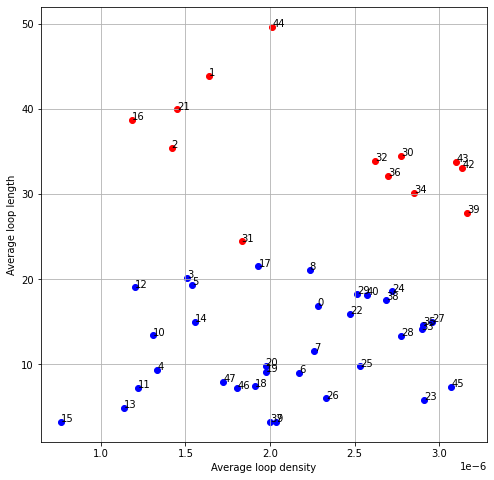

In [90]:
### Remove_big_loops
remoded_loops = []
for key in cycle_node_dict:
    length = len(cycle_node_dict[key])
    if length>15:
        remoded_loops.append(key)
for k in remoded_loops:
    cycle_node_dict.pop(k)
    cycle_edge_dict.pop(k)
print("New loop no.: ", len(cycle_node_dict))

### Loop classification ###
prev_loop_density = density_loop_nodes(prev_node_id_list, prev_node_dict, cycle_node_dict, band=10)
prev_loop_length = length_loop_edges(prev_edge_length_dict, prev_edge_id_list, cycle_edge_dict)
feature1 = prev_loop_density
feature2 = prev_loop_length

# for key in prev_loop_density:
#     feature1.append(prev_loop_density[key][1])
#     feature2.append(prev_loop_length[key][1])
    
text1 = 'Average loop density'
text2 = 'Average loop length'
text3 = 'Average loop surface_area'
classification_dict = draw_features_cluster('2D', feature1, feature2, [text1, text2], cycle_node_dict)

# new_layout = layout()
data1, all_loop_node1, all_loop_edge1 = draw_loop_type(cycle_node_dict, 'type-1', classification_dict, prev_node_dict, prev_node_edge_combo)
prev_data.append(data1)
data2, all_loop_node2, all_loop_edge2 = draw_loop_type(cycle_node_dict, 'type-2', classification_dict, prev_node_dict, prev_node_edge_combo)
prev_data.append(data2)
# type 01 loops ###### New
# num_cluster1, cluster_group_loop1, cluster_group_node1, cluster_group_edge1, data_cluster = clustering_loops('type-1', 
#                                                                                                              classification_dict, 
#                                                                                                              prev_node_dict,
#                                                                                                              prev_edge_id_list, 
#                                                                                                              cycle_node_dict, 
#                                                                                                              cycle_edge_dict, 
#                                                                                                              prev_edge_dict,
#                                                                                                              prev_node_edge_combo)
# prev_data.extend(data_cluster)
prev_fig = go.Figure(prev_data, layout=prev_layout1)
prev_fig.show()

In [52]:
file_handle.close()
file_handle2.close()
file_handle3.close()

In [63]:
############# Plot modified xml ###############
type1_loop_modify_xml = path + dataset + '\\report\\type1_loop_modify_cluster_all(1).xml' 
modified_docs = parse(type1_loop_modify_xml)
modified_layout1 = layout(show_legend=True, w=2000, h=2000)
modified_node_dict, modified_node_id_list = collect_nodes(modified_docs)
modified_edge_list, modified_edge_id_list, modified_edge_dict = collect_edges(modified_docs)
# prev_edge_length_dict = edge_length(edge_id_list=prev_edge_id_list, edge_dict=prev_edge_dict, node_dict=prev_node_dict)
modified_all_skeletons_dict = collect_skeletons(modified_docs, edge_id_list=modified_edge_id_list, 
                                                                edge_dict=modified_edge_dict, 
                                                                node_dict=modified_node_dict)
modified_data = XML_dataset_drawing(node_dict=modified_node_dict, node_id_list=modified_node_id_list, 
                                edge_id_list=modified_edge_id_list, edge_dict=modified_edge_dict,
                                all_skeletons_dict=modified_all_skeletons_dict,
                                    node_text='Modified_Nodes', edge_text='Modified_Edges', 
                        sk_edges='Modified_Skeleton_edges', sk_nodes='Modified_Skeleton_nodes')
prev_data.extend(modified_data)
# modified_fig = go.Figure(modified_data, layout=modified_layout1)
# modified_fig.show()
prev_fig = go.Figure(prev_data, layout=prev_layout1)
prev_fig.show()

In [232]:
### for main function
print('Start New')
modified_node_dict = copy.deepcopy(prev_node_dict)
modified_node_id_list = copy.deepcopy(prev_node_id_list)
# modified_edge_dict = copy.deepcopy(prev_edge_dict)
modified_edge_width_dict = copy.deepcopy(prev_edge_width_dict)
modified_edge_list = copy.deepcopy(prev_edge_list)
modified_edge_id_list = copy.deepcopy(prev_edge_id_list)
# modified_node_edge_combo = copy.deepcopy(prev_node_edge_combo)
modified_all_skeletons_dict = copy.deepcopy(prev_all_skeletons_dict)
# deleted_node_list, not_deleted_node_list,node_modified_list, sk_modified_edge_list, node_modified_edge_list, only_sk_modified_edge_list, deleted_edge_list, modified_edge_dict, modified_node_dict, modified_all_skeletons_dict = modify_type1_loop([1,3,6,10,11], cluster_group_loop1, cluster_group_node1, cluster_group_edge1, 
#                      modified_node_dict, modified_node_id_list, modified_edge_dict, modified_edge_width_dict,
#                      modified_edge_list, modified_edge_id_list, prev_node_edge_combo, modified_all_skeletons_dict)
    

Start New


In [233]:
deleted_node_list, not_deleted_node_list, deleted_edge_list, not_deleted_edge_list = modify_type1_loop([10], cluster_group_loop1, cluster_group_node1, cluster_group_edge1, 
                     prev_node_dict, modified_node_id_list, prev_edge_dict, modified_edge_width_dict,
                     modified_edge_list, modified_edge_id_list, prev_node_edge_combo, modified_all_skeletons_dict)
data = []
layout_test = layout(show_legend=False, w=1500, h=1500)
trace_not_deleted_node =  draw_nodes(prev_node_dict, not_deleted_node_list, c = 'green', text = 'Not_Deleted_Nodes',m='markers+text')
data.append(trace_not_deleted_node)
trace_deleted_node =  draw_nodes(prev_node_dict, deleted_node_list, c = 'red', text = 'Deleted_Nodes',m='markers+text')
data.append(trace_deleted_node)
trace_not_deleted_edges = draw_edges(edge_id_list=not_deleted_edge_list,
                                 edge_dict=prev_edge_dict, node_dict=prev_node_dict, c = 'green', text = 'Not_Deleted_Edges')
trace_deleted_edges = draw_edges(edge_id_list=deleted_edge_list,
                                 edge_dict=prev_edge_dict, node_dict=prev_node_dict, c = 'red', text = 'Deleted_Edges')
data.append(trace_deleted_edges)
data.append(trace_not_deleted_edges)
fig = go.Figure(data, layout=layout_test)
fig.update_layout(font_size=12)
fig.write_image("images/fig final cluster10.png")
fig.show()

cluster no.  10
[438, 86, 244, 437, 438, 28, 563, 86, 143, 102, 364, 28, 563]


num loop1: 3
inside while loop
[290, 519, 1076]
[1076, 889, 890, 521, 519]
l:  [519, 1076]
[724, 889, 1076]
[1076, 889, 890, 521, 519]
l:  [889, 1076]
[889, 890, 891]
[1076, 889, 890, 521, 519]
l:  [889, 890]
[521, 775, 890]
[1076, 889, 890, 521, 519]
l:  [521, 890]
[519, 520, 521]
[1076, 889, 890, 521, 519]
l:  [519, 521]
select_node: 143
num_loop:  3
#### End one loop ####


inside while loop
[774, 775, 776]
[776, 1027, 777, 774]
l:  [774, 776]
[520, 776, 1027]
[776, 1027, 777, 774]
l:  [776, 1027]
[196, 292, 777, 1027]
[776, 1027, 777, 774]
l:  [777, 1027]
[739, 774, 777]
[776, 1027, 777, 774]
l:  [774, 777]
select_node: 437
num_loop:  2
#### End one loop ####


inside while loop
[519, 520, 521, 724, 889, 1076]
[521, 520, 1027, 775]
l:  [520, 521]
[196, 292, 774, 775, 1027]
[521, 520, 1027, 775]
l:  [775, 1027]
select_node: 102
num_loop:  1
#### End one loop ####


inside while loop
[521, 890, 1027]
[889, 890, 521]
l:  [521, 890]
[519, 521, 724, 889, 1076]
[889, 890, 521]
l:  [521, 889]
select_node: 102
num_loop:  0
#### End one loop ####


cluster_not_deleted_node_list: [102, 143, 364, 437, 438]
cluster_not_deleted_edge_list: [724, 889, 1076, 290, 519, 1076, 889, 890, 891, 739, 774, 777, 774, 775, 776]
[(102, 461), (364, 102), (102, 143), (143, 746), (143, 563), (102, 143), (364, 102), (28, 364), (364, 37), (453, 437), (437, 438), (437, 244), (437, 438), (438, 28), (86, 438)]
connected_components_list:  [{37, 102, 453, 746, 364, 461, 143, 563, 244, 437, 438, 86, 28}]


deleted_node_list:  [563, 244, 86, 28]
not_deleted_node_list:  [102, 143, 364, 437, 438]


In [207]:
prev_docs = parse(prev_directory)
type1_loop_modify_xml = path + dataset + '\\report\\type1_loop_modify_new_method.xml'  ## Write different xml for loop type
open(type1_loop_modify_xml, 'w').close()
file_handle = open(type1_loop_modify_xml,"w")
remove_edge_frm_XML(prev_docs, list(np.unique(deleted_edge_list)), prev_edge_id_list, file_handle)

In [208]:
new_docs = parse(type1_loop_modify_xml)
final_modify = path + dataset + '\\report\\final_modify.xml'
open(final_modify, 'w').close()
file_handle2 = open(final_modify,"w")
new_edge_list, new_edge_id_list, new_edge_dict = collect_edges(new_docs)
floating_edges = find_floating_edges(edge_id_list=new_edge_id_list, edge_dict=new_edge_dict)
remove_edge_frm_XML(new_docs, list(np.unique(floating_edges)), new_edge_id_list, file_handle2)

In [37]:
    loop1_doc = path + dataset + '\\report\\loop1_test.xml'  ## Write different xml for loop type
    open(loop1_doc, 'w').close()
    file_handle = open(loop1_doc,"w")
#     directory = main_xml_file
#     docs = parse(directory)
    xml_draw_loop(prev_docs, file_handle, all_loop_edge1, prev_edge_id_list)

In [31]:
    loop2_doc = path + dataset + '\\report\\loop2_test.xml'  ## Write different xml for loop type
    open(loop2_doc, 'w').close()
    file_handle = open(loop2_doc,"w")
#     directory = main_xml_file
#     docs = parse(directory)
    xml_draw_loop(prev_docs, file_handle, all_loop_edge2, prev_edge_id_list)

In [91]:
import plotly.io as pio
import io
from base64 import b64encode

from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output
# import plotly.express as px

buffer = io.StringIO()
#pio.write_html(fig, file='Dataset_006.html', auto_open=True)
prev_fig.write_html(buffer)

html_bytes = buffer.getvalue().encode()
encoded = b64encode(html_bytes).decode()
app = JupyterDash(__name__)
app.layout = html.Div([
    dcc.Graph(id="graph1", figure=prev_fig),
    html.A(
        html.Button("Download HTML"), 
        id="download",
        href="data:text/html;base64,"+ encoded ,
        download="plotly_graph"+dataset+".html"
    )
])
app.run_server(debug=True)

Dash app running on http://127.0.0.1:8050/


C:\Users\HP\anaconda3\envs\new2\lib\site-packages\jupyter_dash\jupyter_app.py:139: UserWarning:

The 'environ['werkzeug.server.shutdown']' function is deprecated and will be removed in Werkzeug 2.1.



In [92]:
## New
workbook = xl.Workbook(path + dataset + '/report/loop_properties.xlsx')
s = workbook.add_worksheet(dataset)
write_excel(s, prev_loop_density, prev_loop_length, cycle_node_dict, cycle_edge_dict)

In [61]:
########## Rev3
################ new
def modify_type1_loop(clusters, cluster_group_loop, cluster_group_node, cluster_group_edge, 
                      modified_node_dict, modified_node_id_list, modified_edge_dict, modified_edge_width_dict,
                     modified_edge_list, modified_edge_id_list, modified_node_edge_combo, modified_all_skeletons_dict):
    ## record
    edited_loop_list = []
    sk_modified_edge_list = []  ## Skeleton modify-> 2 node loops
    node_modified_edge_list = []  ## Pre/Succ node modify
    only_sk_modified_edge_list = [] 
    node_modify_list = []
    edited_width_edge = {}
    deleted_edge_list = []
    deleted_node_list = []
    edited_node_pose_list = []
    final_width_dict = {}
    
    for cluster in clusters:
        print('cluster no. ',cluster)
        edited_loops = list(cluster_group_loop[cluster])
        if np.any(edited_loops) not in edited_loop_list:
            iterable_node_id_list = list(cluster_group_node[cluster])
            iterable_edge_id_list = list(cluster_group_edge[cluster])
            ## collect edge width
            edge_width = {}
            for edge in iterable_edge_id_list:
                edge_width[edge] = modified_edge_width_dict[edge]
            sorted_dict = dict(sorted(edge_width.items(), key=operator.itemgetter(1),reverse=True))
            final_width = modified_edge_width_dict[list(sorted_dict.keys())[0]]
            ##end
            iterable_edge_dict = {}
#             iterable_edge_list = []
            for edge in iterable_edge_id_list:
#                 iterable_edge_list.append(list(modified_edge_dict[edge]))
                iterable_edge_dict[edge] = list(modified_edge_dict[edge])
            for i in iterable_edge_id_list:
                if i in deleted_edge_list:
                    if i in iterable_edge_id_list:
                        iterable_edge_id_list.remove(i)
#                         iterable_edge_list.remove(list(iterable_edge_dict[i]))
                        iterable_edge_dict.pop(i)
                else:
                    pass
            ## Start
            m_cycle_node_list, m_cycle_edge, m_cycle_node_dict, m_cycle_edge_dict = find_loops(node_id_list=iterable_node_id_list, edge_id_list=iterable_edge_id_list, edge_dict=iterable_edge_dict)
            print(m_cycle_node_list)
            ## record
            loop_edges = m_cycle_edge
#             l = list(m_cycle_edge_dict.values())
#             for e in l:
#                 loop_edges.extend(e)
            ##end
            num_loop = len(m_cycle_node_dict)   
            next_start_node = []
            k=0
            draw_iterable_loop(iterable_node_id_list, iterable_edge_id_list, 
                       modified_node_dict, cluster = str(cluster), num = str(k), deleted_edge=deleted_edge_list, modified_edge_dict=modified_edge_dict, 
                       modified_all_skeleton_dict=modified_all_skeletons_dict)
            k = k+1
            print('num loop1:', num_loop)
            while (num_loop>0):
                print('inside while loop')
                loop_num_node = {}
                for loop in m_cycle_node_dict:
                    loop_node = m_cycle_node_dict[loop]
                    loop_num_node[loop] = (len(loop_node))

                ascending = list(dict(sorted(loop_num_node.items(), key=operator.itemgetter(1),reverse=False)).keys())
                modify_edge_list = []
                remove_edge_list = []
                for a in ascending:
                    n = len(m_cycle_node_dict[a])
                    if n<3:
                        pass
                    else:
                        smallest_loop = a
                        break

            #     for loop in ascending:
                nodes = m_cycle_node_dict[smallest_loop]
                if len(nodes) >= 3:
                    if (set(next_start_node) & set(nodes)):
                        s = list(set(next_start_node) & set(nodes))
                    else:
                        s = nodes
                    ## angle selet
                    angle_dict = {}
                    for node in s:
                        edge = modified_node_edge_combo[node]
                        l = []
                        print(edge)
                        print(m_cycle_edge_dict[smallest_loop])
                        for e in edge:
                            if e in m_cycle_edge_dict[smallest_loop]:
                                l.append(e)
                        print('l: ',l)
                        if len(l)== 2:
                            edge1 = modified_edge_dict[l[0]]
                            edge2 = modified_edge_dict[l[1]]
                            node1 = edge1[0] if edge1[1]==node else edge1[1]
                            node2 = edge2[0] if edge2[1]==node else edge2[1]
                            angle_dict[node] = find_angel((node1,node),(node2,node), modified_node_dict)
                        else:
                            pass
                    sorted_angle_dict = list(dict(sorted(angle_dict.items(), key=operator.itemgetter(1),reverse=False)).keys())      
                    if sorted_angle_dict:
                        select_node = sorted_angle_dict[0]
                    else:
                        select_node = random.choices(s, k=1)[0]
                    print('select_node:',select_node)
                    ##end

                    edges = m_cycle_edge_dict[smallest_loop]
                    # new
                    select_edge = []
                    for e in edges:
                        node1 = modified_edge_dict[e][0]
                        node2 = modified_edge_dict[e][1]
                        if node1 == select_node or node2 == select_node:
                            select_edge.append(e)
                    edge1_nodes = modified_edge_dict[select_edge[0]]
                    edge2_nodes = modified_edge_dict[select_edge[1]]
                    n1 = edge1_nodes[0] if edge1_nodes[0]!=select_node else edge1_nodes[1]
                    n2 = edge2_nodes[0] if edge2_nodes[0]!=select_node else edge2_nodes[1]
                    next_start_node.append(n1)
                    remove_edge, edited_edge, modified_all_skeletons_dict = modify_loops_with_2nodes([(select_edge[0],select_edge[1])], modified_all_skeletons_dict, modified_edge_dict, modified_node_dict, modified_node_edge_combo, modified_edge_width_dict)
#                     remove_edge, edited_edge, modified_all_skeletons_dict = modify_loops_with_2nodes([(select_edge[0],select_edge[1])], modified_all_skeletons_dict)
                    sk_modified_edge_list.append(edited_edge[0])
                    deleted_edge_list.append(remove_edge[0])
                    ## delete
#                         modified_edge_id_list.remove(remove_edge[0])
                    iterable_edge_id_list.remove(remove_edge[0])
#                         if list(modified_edge_dict[remove_edge[0]]) in modified_edge_list:
#                         modified_edge_list.remove(list(modified_edge_dict[remove_edge[0]]))
#                     iterable_edge_list.remove(list(modified_edge_dict[remove_edge[0]]))
                    iterable_edge_dict.pop(remove_edge[0])

                    ## modify
                    dist, mid_point = node_dist([n1, n2], modified_node_dict)
                    n1_edges = modified_node_edge_combo[n1]
                    ### change skeleton for n1 edges
                    for n in n1_edges:
                        new_skeletons = 10
                        node1 = modified_edge_dict[n][0]
                        node2 = modified_edge_dict[n][1]
                        if node1 == n1:
                            sk_rd = modified_all_skeletons_dict[n][1][0]
                            new_sk = interpolate_points(new_skeletons, mid_point, modified_node_dict[n1])
                            prev_sk = modified_all_skeletons_dict[n][0]
                            modified_all_skeletons_dict[n][0] = new_sk + prev_sk
                            prev_sk_rd = modified_all_skeletons_dict[n][1]
                            modified_all_skeletons_dict[n][1] = [sk_rd]*new_skeletons + prev_sk_rd
                        elif node2 ==n1:
                            sk_rd = modified_all_skeletons_dict[n][1][-1]
                            new_sk = interpolate_points(new_skeletons, modified_node_dict[n1], mid_point)
                            prev_sk = modified_all_skeletons_dict[n][0]
                            modified_all_skeletons_dict[n][0] = prev_sk + new_sk
                            prev_sk_rd = modified_all_skeletons_dict[n][1]
                            modified_all_skeletons_dict[n][1] = prev_sk_rd + [sk_rd]*new_skeletons 
                        only_sk_modified_edge_list.append(n)
                    ### end
                    n2_edges = modified_node_edge_combo[n2]
                    modified_node_dict[n1] = np.array(mid_point)
                    node_modify_list.append(n1)
                    edited_node_pose_list.append(n1)
                    for e in n2_edges:
                        if e!= remove_edge[0] :
                            other_n = modified_edge_dict[e][1] if modified_edge_dict[e][1]!=n2 else modified_edge_dict[e][0]
                            if (n1 != other_n) and e not in n1_edges:
                                index = modified_edge_list.index(list(modified_edge_dict[e]))
                                modified_edge_list[index] = [n1, other_n]
#                                 iterable_index = iterable_edge_list.index(list(iterable_edge_dict[e]))
#                                 iterable_edge_list[iterable_index] = [n1, other_n]
                                modified_edge_dict[e] = [n1, other_n]
                                iterable_edge_dict[e] = [n1, other_n]
                                node_modified_edge_list.append(e)
                                ## edit skeleton    
                                new_skeletons = 10
                                sk_rd = modified_all_skeletons_dict[e][1][-1]
                                node1 = modified_node_dict[n1]
                                node2 = modified_node_dict[n2]
                                new_sk = interpolate_points(new_skeletons, node1, node2)
                                prev_sk = modified_all_skeletons_dict[e][0]
                                modified_all_skeletons_dict[e][0] = new_sk + prev_sk
                                prev_sk_rd = modified_all_skeletons_dict[e][1]
                                modified_all_skeletons_dict[e][1] = [sk_rd]*new_skeletons + prev_sk_rd
                                ##end
                            elif (n1 == other_n) or e in n1_edges:
#                                     modified_edge_id_list.remove(e)
                                if e in iterable_edge_id_list:
                                    iterable_edge_id_list.remove(e)
#                                     iterable_edge_list.remove(list(modified_edge_dict[e]))
                                    iterable_edge_dict.pop(e)
#                                     modified_edge_list.remove(list(modified_edge_dict[e]))
                                if e in n2_edges:
                                    n2_edges.remove(e)
                                if e in modified_node_edge_combo[n1]:
                                    modified_node_edge_combo[n1].remove(e)
                                deleted_edge_list.append(e)
#                         modified_node_edge_combo.pop(n2)
                    if remove_edge[0] in n2_edges:
                        n2_edges.remove(remove_edge[0])
                    modified_node_edge_combo[n1] = list(np.unique(list(n1_edges) + list(n2_edges)))
                    if remove_edge[0] in modified_node_edge_combo[select_node]:
                        modified_node_edge_combo[select_node].remove(remove_edge[0])
                    deleted_node_list.append(n2)

                else:
                    print('break')
                    break
                cycle_edge2 = find_loops_with_2nodes(iterable_edge_id_list, iterable_edge_dict)
                if (len(cycle_edge2)>0):
                    removed_edge, edited_edge, modified_all_skeletons_dict = modify_loops_with_2nodes(cycle_edge2, modified_all_skeletons_dict, modified_edge_dict, modified_node_dict, modified_node_edge_combo, modified_edge_width_dict)
#                     remove_edge, edited_edge, modified_all_skeletons_dict = modify_loops_with_2nodes(cycle_edge2, modified_all_skeletons_dict)
                    sk_modified_edge_list.append(edited_edge[0])
                    deleted_edge_list.append(removed_edge[0])
                    ## delete
                    node1 = modified_edge_dict[removed_edge[0]][0]
                    node2 = modified_edge_dict[removed_edge[0]][1]
                    if removed_edge[0] in modified_node_edge_combo[node1]:
                        modified_node_edge_combo[node1].remove(removed_edge[0])
                    if removed_edge[0] in modified_node_edge_combo[node2]:
                        modified_node_edge_combo[node2].remove(removed_edge[0])

#                     modified_edge_id_list.remove(removed_edge[0])
                    if removed_edge[0] in iterable_edge_id_list:
                        iterable_edge_id_list.remove(removed_edge[0])
    #                     modified_edge_list.remove(list(modified_edge_dict[removed_edge[0]]))
#                         iterable_edge_list.remove(list(modified_edge_dict[removed_edge[0]]))
                        iterable_edge_dict.pop(removed_edge[0])
                    for i in cycle_edge2:
                        cycle_edge2.remove(i)
                m_cycle_node_list, m_cycle_edge, m_cycle_node_dict, m_cycle_edge_dict = find_loops(node_id_list=iterable_node_id_list, edge_id_list=iterable_edge_id_list, edge_dict=iterable_edge_dict)
                num_loop = len(m_cycle_node_dict) 
                print('num_loop: ', num_loop)
                print('m_cycle_edge_dict',m_cycle_edge_dict)
                print('skeleton_edited_edges: ',sk_modified_edge_list)
                print('Pre/Succ id edited_edges: ',node_modified_edge_list)
                print('Remaining edges: ', iterable_edge_id_list)
                print('Deleted_edges: ',deleted_edge_list)
                print('Deleted_nodes: ',deleted_node_list)
                print('edited_node_pose_list: ',edited_node_pose_list)
                print('#### End one loop ####')
                draw_iterable_loop(iterable_node_id_list, iterable_edge_id_list, 
                       modified_node_dict, cluster = str(cluster), num = str(k), deleted_edge=deleted_edge_list, modified_edge_dict=modified_edge_dict, 
                       modified_all_skeleton_dict=modified_all_skeletons_dict)
                k = k + 1
            edited_loop_list.extend(edited_loops)
            print('edited_loop_list: ',edited_loop_list)
            #### delete noisy edges
            for edge in iterable_edge_id_list:
                node1 = modified_edge_dict[edge][0]
                node2 = modified_edge_dict[edge][1]
                neighbour_edge1 = modified_node_edge_combo[node1]
                neighbour_edge2 = modified_node_edge_combo[node2]
                if len(neighbour_edge1)==1 or len(neighbour_edge2)==1:
#                     pass
                    deleted_edge_list.append(edge)
                    if edge in iterable_edge_id_list:
                        iterable_edge_id_list.remove(edge)
#                         iterable_edge_list.remove(list(modified_edge_dict[edge]))
                        iterable_edge_dict.pop(edge)
            remaining_loop_edges = []
            for e in iterable_edge_id_list:
                if e in loop_edges:
                    remaining_loop_edges.append(e)
            print('edited_width_edge_list: ', remaining_loop_edges)
            edited_width_edge[cluster] = remaining_loop_edges
            final_width_dict[cluster] = final_width
            
            for e in deleted_edge_list:
                if e in sk_modified_edge_list:
                    sk_modified_edge_list.remove(e)
                if e in node_modified_edge_list:
                    node_modified_edge_list.remove(e)
            
            #### final skeleton change #####
            for e in remaining_loop_edges:
                num_sk = len(modified_all_skeletons_dict[e][0])
                node1 = modified_node_dict[modified_edge_dict[e][0]]
                node2 = modified_node_dict[modified_edge_dict[e][1]]
                modified_all_skeletons_dict[e][0] = interpolate_points(num_sk, node1, node2)
                if e not in sk_modified_edge_list:
                    sk_modified_edge_list.append(e)
            
            draw_iterable_loop(iterable_node_id_list, iterable_edge_id_list, 
                       modified_node_dict, cluster = str(cluster), num = str(k), deleted_edge=deleted_edge_list, modified_edge_dict=modified_edge_dict, 
                       modified_all_skeleton_dict=modified_all_skeletons_dict)
            ## end   
    return node_modify_list, sk_modified_edge_list, node_modified_edge_list, only_sk_modified_edge_list, deleted_edge_list, modified_edge_dict, modified_node_dict, modified_all_skeletons_dict

In [81]:
prev_docs = parse(prev_directory)
type1_loop_modify_xml = path + dataset + '\\report\\type1_loop_modify_cluster_all(1).xml'  ## Write different xml for loop type
open(type1_loop_modify_xml, 'w').close()
xml_skeleton_addition(prev_docs, type1_loop_modify_xml, 
                      start_end_modified_edge_list=only_sk_modified_edge_list+node_modified_edge_list, 
                      edge_id_list_prev=prev_edge_id_list,
                      modified_skeleton_dict=modified_all_skeletons_dict)

cluster_removed2 = parse(type1_loop_modify_xml)
file_handle2 = open(type1_loop_modify_xml,"w")
xml_node_position_modify(cluster_removed2, file_handle2, node_modified_list, modified_node_dict, prev_node_id_list)

cluster_removed3 = parse(type1_loop_modify_xml)
file_handle3 = open(type1_loop_modify_xml,"w")
XML_modify_edge(cluster_removed3, file_handle3, skeleton_modified_edge_list=sk_modified_edge_list, start_end_modified_edge_list=node_modified_edge_list,
                modified_edge_dict=modified_edge_dict, edge_id_list_prev=prev_edge_id_list, modified_skeleton_dict=modified_all_skeletons_dict)

cluster_removed4 = parse(type1_loop_modify_xml)
file_handle4 = open(type1_loop_modify_xml,"w")
remove_edge_frm_XML(cluster_removed4, list(np.unique(deleted_edge_list)), prev_edge_id_list, file_handle4)

start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start adding sk
start writing sk
start addi